Nested sampling. Sticking with dynesty since jaxns uses too much memory when compiling, presumably due to `interp2d`.

In [1]:
%load_ext autoreload
%autoreload 2

import pickle
from itertools import product
import numpy as np
import matplotlib.pyplot as plt
from corner import corner
from tqdm.auto import tqdm, trange
import dynesty
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from scipy.optimize import minimize_scalar

import jax
import jax.numpy as jnp
from jax import random

from pydd.binary import *
from pydd.analysis import *
from pydd.noise import *

## Maximizing over $\tilde{t}_c$

In [4]:
from functools import partial
from jax import jit


@partial(jit, static_argnums=(4,))
def calculate_match_unnormd_fft(params_h, params_d, f_l, f_h, n):
    f_h = jnp.minimum(f_h, jnp.minimum(params_h.f_c, params_d.f_c))
    fs = jnp.linspace(f_l, f_h, n)
    df = fs[1] - fs[0]

    wf_hs = amp_plus(fs, params_h) * jnp.exp(1j * Psi(fs, params_h))
    wf_ds = amp_plus(fs, params_d) * jnp.exp(1j * Psi(fs, params_d))
    overlap_tc = jnp.fft.fft(4 * wf_hs * wf_ds.conj() * df / S_n_LISA(fs))
    return jnp.abs(overlap_tc).max()


@partial(jit, static_argnums=(4, 5))
def loglikelihood_fft(
    params_h: Binary, params_d: Binary, f_l, f_h, n, n_same
):
    # Waveform magnitude
    ip_hh = calculate_SNR(params_h, f_l, f_h, n_same) ** 2
    # Inner product of waveforms, maximized over Phi_c by taking absolute value
    ip_hd = calculate_match_unnormd_fft(params_h, params_d, f_l, f_h, n)
    # Maximize over distance
    return 1 / 2 * ip_hd ** 2 / ip_hh

In [2]:
# Discoverable system
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(1e-3 * MSUN / PC ** 3)
gamma_s = jnp.array(2.2)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
dd_v = VacuumBinary(dd_s.M_chirp, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c)

t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

In [25]:
tT_cs = jnp.linspace(-300, 0, 50)
logLs = []
for tT_c in tT_cs:
    # dd_alt = DynamicDress(**{**dd_s._asdict(), **{"tT_c": jnp.array(tT_c)}})
    dd_alt = DynamicDress(
        jnp.array(2.2),
        jnp.array(0.5e-6),
        dd_s.M_chirp,
        dd_s.q,
        dd_s.Phi_c,
        jnp.array(tT_c),
        dd_s.dL_iota,
        dd_s.f_c
    )
    logLs.append(loglikelihood(dd_alt, dd_s, f_l, f_c, 20000, 3000))

logLs = jnp.array(logLs)

In [11]:
%timeit loglikelihood(dd_alt, dd_s, f_l, f_c, 20000, 3000)

13.7 ms ± 256 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [12]:
%timeit loglikelihood_fft(dd_alt, dd_s, f_l, f_c, 100000, 3000)

54 ms ± 2.16 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


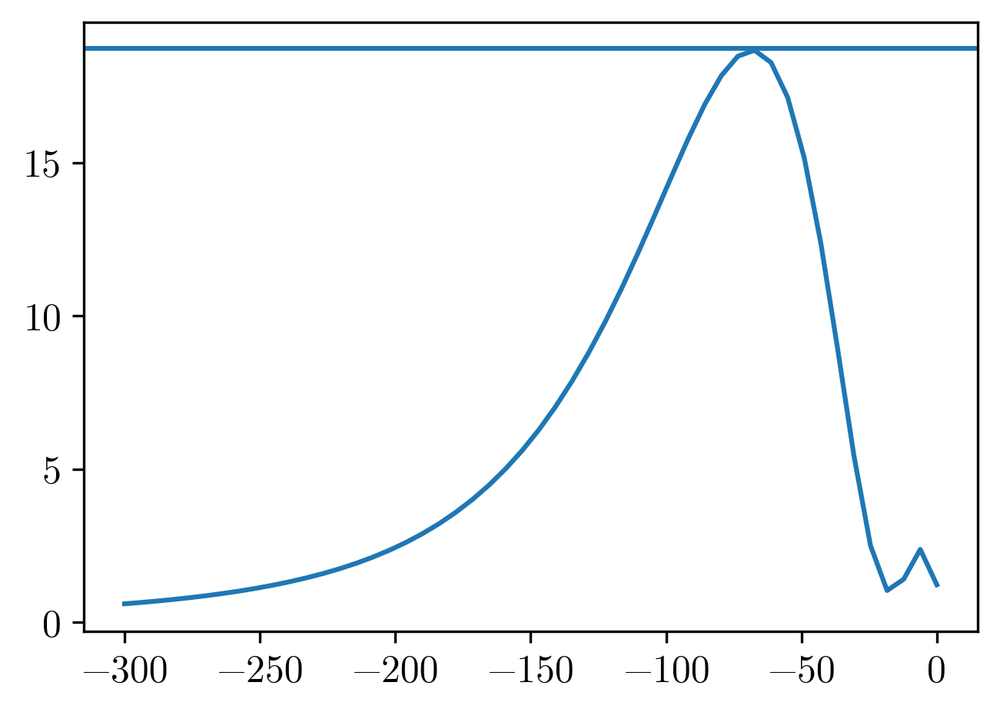

In [26]:
plt.plot(tT_cs, logLs)
# plt.axhline(loglikelihood_fft(dd_alt, dd_s, f_l, f_c, 30000, 3000))
# plt.axhline(loglikelihood_fft(dd_alt, dd_s, f_l, f_c, 60000, 3000))
plt.axhline(loglikelihood_fft(dd_alt, dd_s, f_l, f_c, 100000, 3000))

Try out nested sampling with this likelihood!

In [ ]:
# Discoverable system
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(1e-3 * MSUN / PC ** 3)
gamma_s = jnp.array(2.2)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
dd_v = VacuumBinary(dd_s.M_chirp, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c)

t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

# Dephasing
dN = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive): {dN}")

In [116]:
# @jax.jit
def logL_3d_fft(x):
    # gamma_s, c_f, M_chirp_MSUN, q = x
    gamma_s, c_f, M_chirp_MSUN = x
    q = dd_s.q
    dd_h = DynamicDress(
        gamma_s,
        c_f,
        M_chirp_MSUN * MSUN,
        q,
        dd_s.Phi_c,
        dd_s.tT_c,
        dd_s.dL_iota,
        get_f_isco(get_m_1(M_chirp_MSUN * MSUN, q))
    )
    f_h = jnp.maximum(dd_s.f_c, dd_h.f_c)
    return loglikelihood_fft(dd_h, dd_s, f_l, f_h, 100000, 3000)

In [118]:
print(logL_3d_fft(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN])))#, dd_s.q])))
print(logL_3d_fft(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN])))#, dd_s.q])))

42.47663926376372
42.47663926376372


In [119]:
gamma_s_range = [2.03, 3]  # lower gamma_s gives nan likelihood...
c_f_range = [0, 5e-6]
dM_chirp_MSUN_range = [-1e-3, 1.5e-3]
# q_range = [0.0001, 0.005]

labels = (
    r"$\gamma_s$",
    r"$c_f$ [?]",
    r"$\mathcal{M}$ [M$_\odot$]",
#     r"$q$",
)


def ptform(u):
    dM_chirp_MSUN = (dM_chirp_MSUN_range[1] - dM_chirp_MSUN_range[0]) * u[
        2
    ] + dM_chirp_MSUN_range[0]
    return jnp.array(
        [
            (gamma_s_range[1] - gamma_s_range[0]) * u[0] + gamma_s_range[0],
            (c_f_range[1] - c_f_range[0]) * u[1] + c_f_range[0],
            dd_s.M_chirp / MSUN + dM_chirp_MSUN,
#             (q_range[1] - q_range[0]) * u[3] + q_range[0],
        ]
    )

In [122]:
logL_3d_fft(ptform(jnp.zeros((4,)))), logL_3d_fft(ptform(jnp.full((4,), 0.5))), logL_3d_fft(ptform(jnp.ones((4,))))

(Buffer(0.33681317, dtype=float64),
 Buffer(0.89503146, dtype=float64),
 Buffer(0.30300217, dtype=float64))

In [124]:
sampler = dynesty.NestedSampler(
    logL_3d_fft, ptform, len(labels), nlive=1000, bound="multi"
)
sampler.run_nested()
results = sampler.results
print(results.summary())

9930it [48:44,  3.40it/s, +1000 | bound: 13 | nc: 1 | ncall: 55141 | eff(%): 19.822 | loglstar:   -inf < 42.464 <    inf | logz: 32.674 +/-  0.143 | dlogz:  0.001 >  1.009]

Summary
nlive: 1000
niter: 9930
ncall: 55141
eff(%): 19.822
logz: 32.674 +/-  0.143
None


In [65]:
# # Save results!
# with open('4d-dynesty-sampler-discoverable.pkl', 'wb') as output:
#     pickle.dump(sampler, output, pickle.HIGHEST_PROTOCOL)

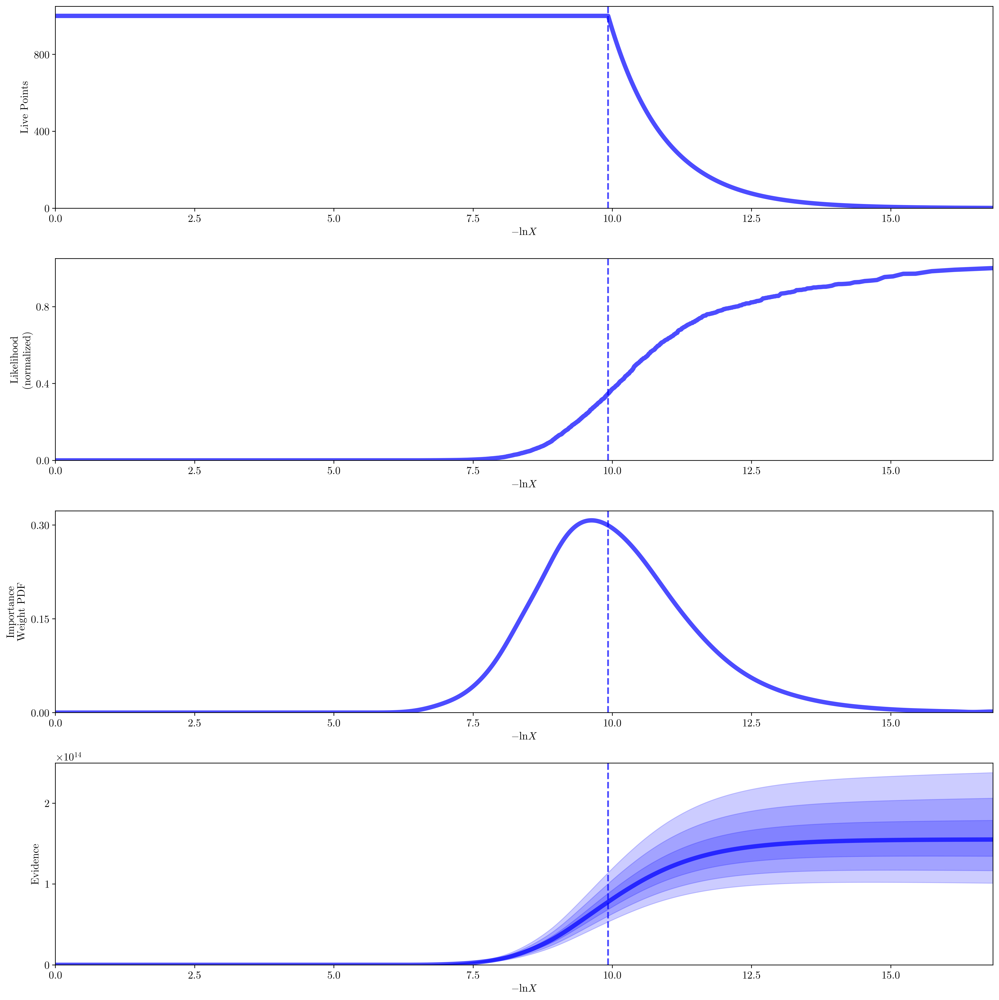

In [125]:
rfig, raxes = dyplot.runplot(results)
rfig.tight_layout()

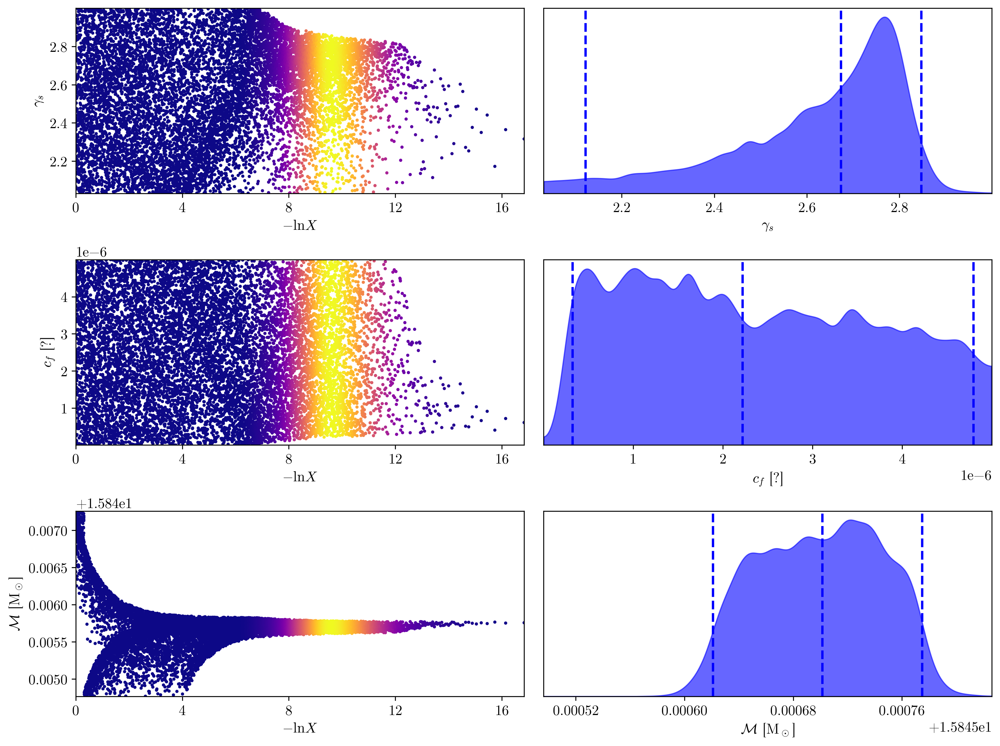

In [126]:
tfig, taxes = dyplot.traceplot(results, labels=labels)
tfig.tight_layout()

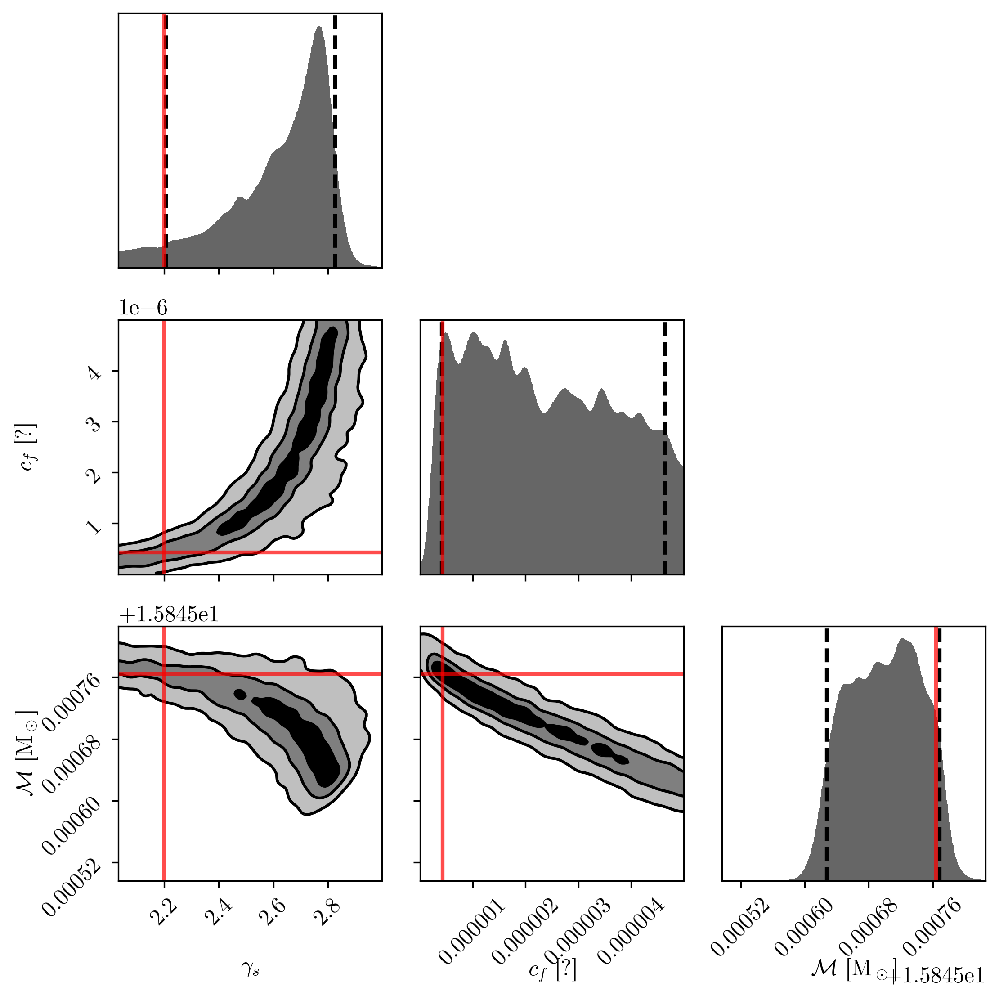

In [127]:
cfig, caxes = dyplot.cornerplot(
    results,
    labels=labels,
    quantiles=[1 - 0.95, 0.95],
    quantiles_2d=[1 - np.exp(-x ** 2 / 2) for x in [1, 2, 3]],#, 4, 5]],
#     smooth=0.02,
#     cmap="viridis",
    truths=(dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.q),
)
cfig.tight_layout()

In [135]:
dd_s.gamma_s.item(), dd_s.c_f.item(), dd_s.M_chirp.item()/MSUN

(2.2, 4.289803019286402e-07, 15.845764038704388)

In [138]:
tuple(results.samples[-1]), results.logl[-1]

((2.3159369624108717, 6.068434268200357e-07, 15.84575638775598),
 42.464039293191114)

In [139]:
dd_alt = DynamicDress(
    jnp.array(results.samples[-1][0] * 1.0),
    jnp.array(results.samples[-1][1]),
    jnp.array(results.samples[-1][2] * MSUN),
    dd_s.q,
    dd_s.Phi_c,
    dd_s.tT_c,
    dd_s.dL_iota,
    get_f_isco(
        get_m_1(
            jnp.array(results.samples[-1][2] * MSUN), dd_s.q
        )
    ),
)

In [140]:
loglikelihood_fft(dd_alt, dd_s, f_l, f_c, 100000, 3000)

Buffer(42.46403929, dtype=float64)

In [133]:
loglikelihood_fft(dd_s, dd_s, f_l, f_c, 100000, 3000)

Buffer(42.47663926, dtype=float64)

## Dynamic dress (4D)
Working!

In [ ]:
# Astro benchmark
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(226 * MSUN / PC**3)
gamma_s = jnp.array(7 / 3)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

In [206]:
# Discoverable system
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(1e-3 * MSUN / PC ** 3)
gamma_s = jnp.array(2.2)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
dd_v = VacuumBinary(dd_s.M_chirp, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c)

t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

# Dephasing
dN = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive): {dN}")

dN (naive): 32.47354087843051


In [207]:
# @jax.jit
def logL_4d(x):
    gamma_s, c_f, M_chirp_MSUN, tT_c = x
    dd_h = DynamicDress(
        gamma_s,
        c_f,
        M_chirp_MSUN * MSUN,
        dd_s.q,  # fixed
        dd_s.Phi_c,  # fixed
        tT_c,
        dd_s.dL_iota,  # value doesn't matter
        get_f_isco(get_m_1(M_chirp_MSUN * MSUN, dd_s.q))
    )
    f_h = jnp.maximum(dd_s.f_c, dd_h.f_c)
    return loglikelihood(dd_h, dd_s, f_l, f_h, 3000, 3000)

In [208]:
print(logL_4d(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.tT_c])))
print(logL_4d(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.tT_c])))

42.26653735672355
42.26653735672355


In [278]:
gamma_s_range = [2.03, 3]  # lower gamma_s gives nan likelihood...
c_f_range = [0, 5e-6]
dM_chirp_MSUN_range = [-1e-3, 1.5e-3]
tT_c_range = [-60, 60]

prior_vol = (
    (gamma_s_range[1] - gamma_s_range[0])
#     * (c_f_range[1] - c_f_range[0])
#     * (dM_chirp_MSUN_range[1] - dM_chirp_MSUN_range[0])
    * (tT_c_range[1] - tT_c_range[0])
)

labels = (
    r"$\gamma_s$",
    r"$c_f$ [?]",
    r"$\mathcal{M}$ [M$_\odot$]",
    r"$\tilde{t}_c$ [s]",
)


def ptform(u):
    dM_chirp_MSUN = (dM_chirp_MSUN_range[1] - dM_chirp_MSUN_range[0]) * u[
        2
    ] + dM_chirp_MSUN_range[0]
    return jnp.array(
        [
            (gamma_s_range[1] - gamma_s_range[0]) * u[0] + gamma_s_range[0],
            (c_f_range[1] - c_f_range[0]) * u[1] + c_f_range[0],
            dd_s.M_chirp / MSUN + dM_chirp_MSUN,
            (tT_c_range[1] - tT_c_range[0]) * u[3] + tT_c_range[0],
        ]
    )

In [279]:
logL_4d(ptform([0, 0, 0, 0]))

Buffer(0.02000611, dtype=float64)

Run sampler

In [280]:
sampler = dynesty.NestedSampler(logL_4d, ptform, len(labels), nlive=2000, bound="multi")
sampler.run_nested()
results = sampler.results
print(results.summary())

24477it [11:36, 35.12it/s, +2000 | bound: 18 | nc: 1 | ncall: 125156 | eff(%): 21.155 | loglstar:   -inf < 42.230 <    inf | logz: 29.140 +/-  0.149 | dlogz:  0.001 >  2.009]

Summary
nlive: 2000
niter: 24477
ncall: 125156
eff(%): 21.155
logz: 29.140 +/-  0.149
None


In [281]:
# # Save results!
# with open('4d-dynesty-sampler-discoverable.pkl', 'wb') as output:
#     pickle.dump(sampler, output, pickle.HIGHEST_PROTOCOL)

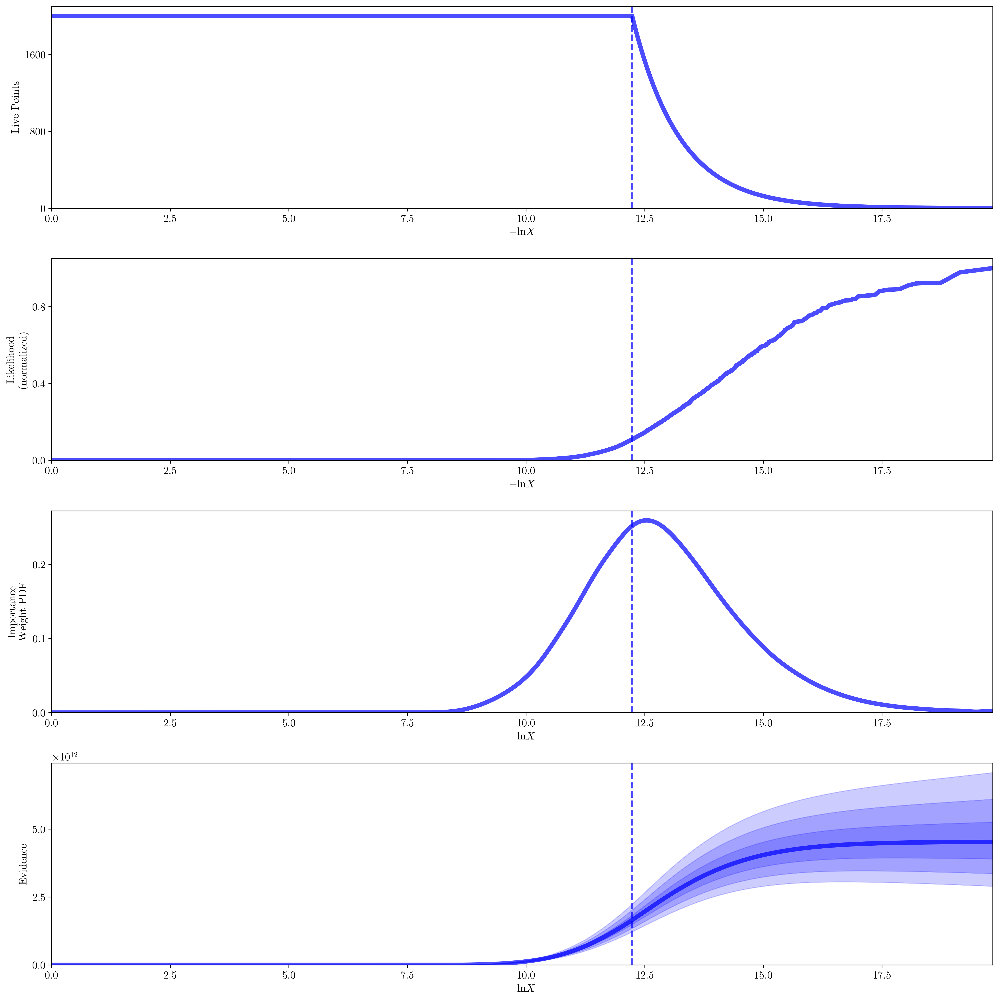

In [282]:
rfig, raxes = dyplot.runplot(results)
rfig.tight_layout()

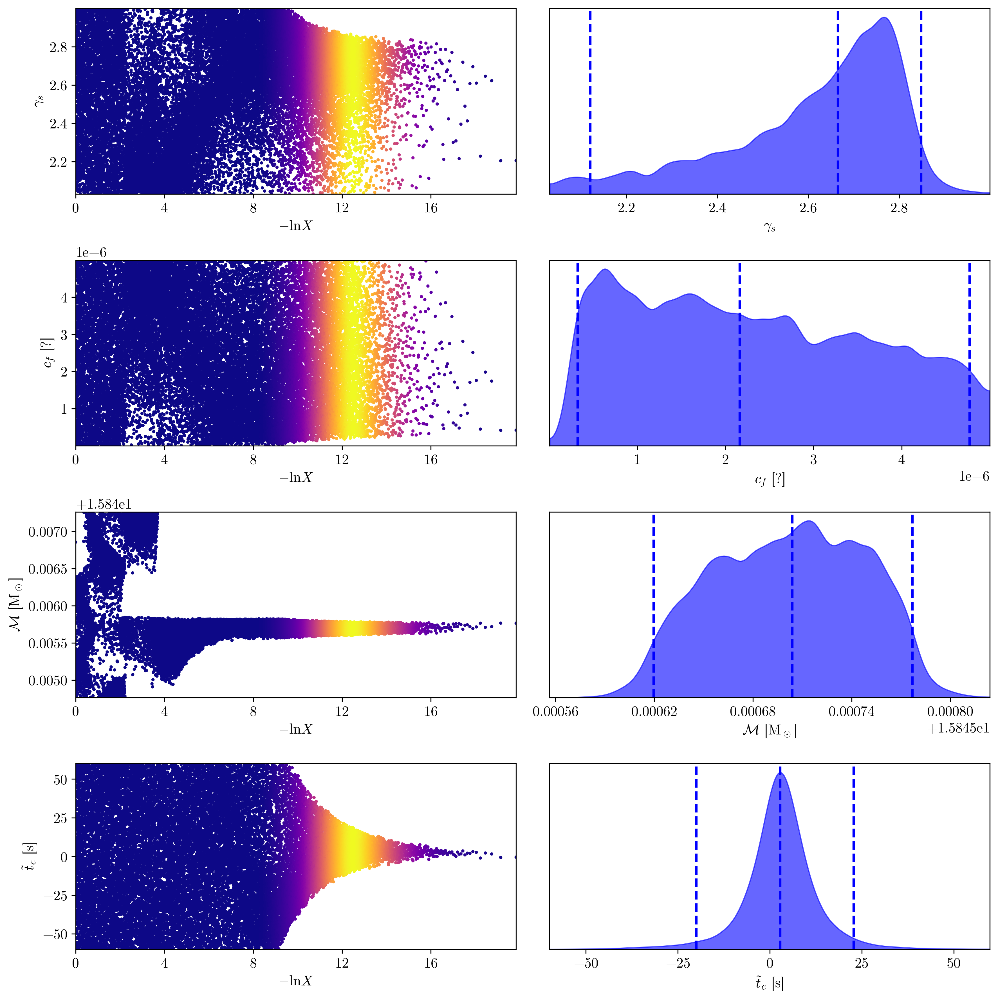

In [283]:
tfig, taxes = dyplot.traceplot(results, labels=labels)
tfig.tight_layout()

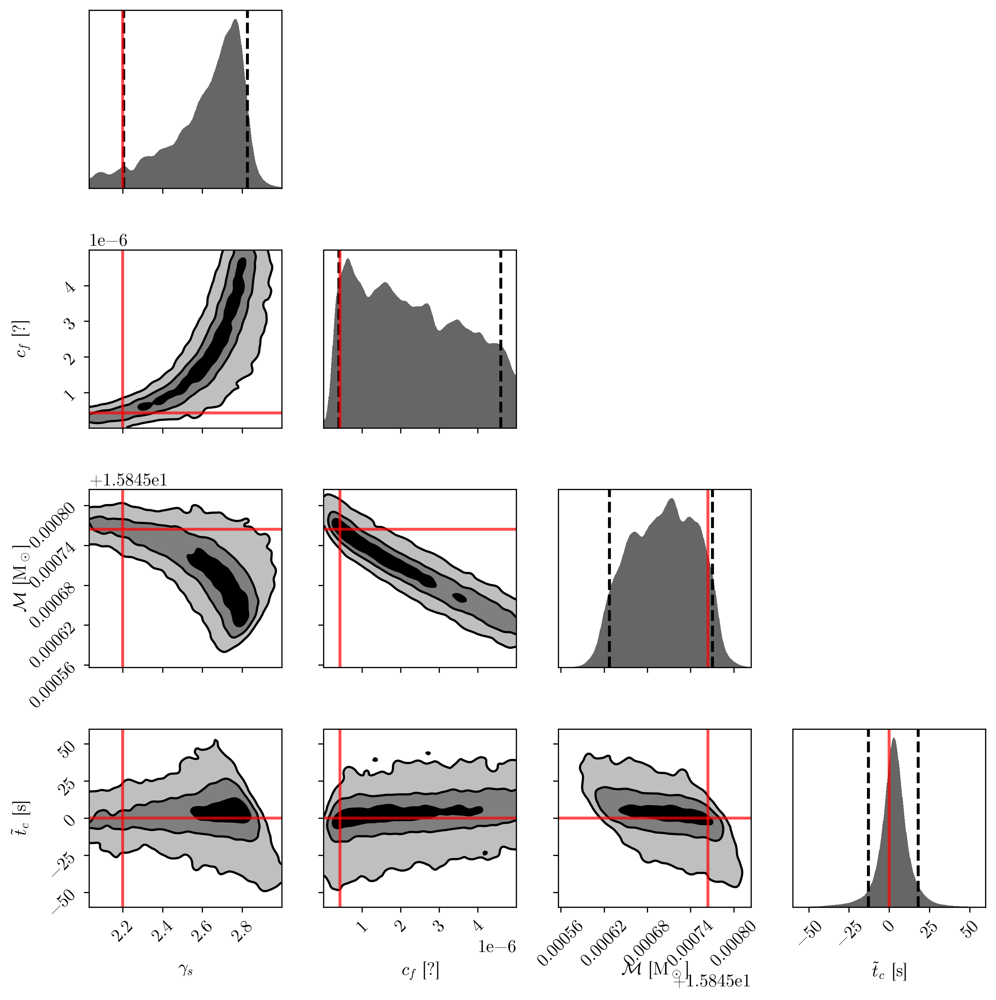

In [284]:
cfig, caxes = dyplot.cornerplot(
    results,
    labels=labels,
    quantiles=[1 - 0.95, 0.95],
    quantiles_2d=[1 - np.exp(-x ** 2 / 2) for x in [1, 2, 3]],#, 4, 5]],
#     smooth=0.02,
#     cmap="viridis",
    truths=(dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.tT_c),
)
cfig.tight_layout()

## Dynamic dress (5D)
Not working...

In [ ]:
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(226 * MSUN / PC**3)
gamma_s = jnp.array(7 / 3)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

In [8]:
# Load nested sampling results
def logL_4d(x):
    gamma_s, c_f, M_chirp_MSUN, tT_c = x
    dd_h = DynamicDress(
        gamma_s,
        c_f,
        M_chirp_MSUN * MSUN,
        dd_s.q,  # fixed
        dd_s.Phi_c,  # fixed
        tT_c,
        dd_s.dL_iota,  # value doesn't matter
        get_f_isco(get_m_1(M_chirp_MSUN * MSUN, dd_s.q))
    )
    f_h = jnp.maximum(dd_s.f_c, dd_h.f_c)
    return loglikelihood(dd_h, dd_s, f_l, f_h, 3000, 3000)

r_gamma_s = 1.2e-1
r_c_f = 2.5e-1
r_M_chirp_MSUN = 1.2e-4
d_tT_c = 170

def ptform(u):
    return jnp.array([
        dd_s.gamma_s * (1 + r_gamma_s * (2 * u[0] - 1)),
        dd_s.c_f * (1 + r_c_f * (2 * u[1] - 1)),
        dd_s.M_chirp / MSUN * (1 + r_M_chirp_MSUN * (2 * u[2] - 1)),
        d_tT_c * (2 * u[3] - 1)
    ])

with open('4d-sampler.pkl', 'rb') as input:
    sampler = pickle.load(input)

# Get sample covariance for proposal distribution
results = sampler.results
samples, weights = results.samples, np.exp(results.logwt - results.logz[-1])
cov_4d = dyfunc.mean_and_cov(samples, weights)[1]

In [10]:
# @jax.jit
def logL_5d(x):
    gamma_s, c_f, M_chirp_MSUN, q, tT_c = x
    dd_h = DynamicDress(
        gamma_s,
        c_f,
        M_chirp_MSUN * MSUN,
        q,  # fixed
        dd_s.Phi_c,  # fixed
        tT_c,
        dd_s.dL_iota,  # value doesn't matter
        get_f_isco(get_m_1(M_chirp_MSUN * MSUN, q))
    )
    f_h = jnp.maximum(dd_s.f_c, dd_h.f_c)
    return loglikelihood(dd_h, dd_s, f_l, f_h, 3000, 3000)

In [12]:
print(logL_5d(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.q, dd_s.tT_c])))
print(logL_5d(jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.q, dd_s.tT_c])))

42.26262029583366
42.26262029583366


In [147]:
r_gamma_s = 1.2e-1
r_c_f = 2.5e-1
r_M_chirp_MSUN = 1.2e-4
r_q = 0.5
d_tT_c = 170

labels = (
    r"$\gamma_s$",
    r"$c_f$ [?]",
    r"$\mathcal{M}$ [M$_\odot$]",
    r"$q$",
    r"$\tilde{t}_c$ [s]"
)
truths_4d = jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.tT_c])
truths_5d = jnp.array([dd_s.gamma_s, dd_s.c_f, dd_s.M_chirp / MSUN, dd_s.q, dd_s.tT_c])

def ptform_5d(u):
    return jnp.array([
        dd_s.gamma_s * (1 + r_gamma_s * (2 * u[0] - 1)),
        dd_s.c_f * (1 + r_c_f * (2 * u[1] - 1)),
        dd_s.M_chirp / MSUN * (1 + r_M_chirp_MSUN * (2 * u[2] - 1)),
        dd_s.q * (1 + r_q * (2 * u[3] - 1)),
        d_tT_c * (2 * u[4] - 1)
    ])


def inv_ptform_5d(v):
    return jnp.array([
        1 / 2 * (1 / r_gamma_s * (v[0] / dd_s.gamma_s - 1) + 1),
        1 / 2 * (1 / r_c_f * (v[1] / dd_s.c_f - 1) + 1),
        1 / 2 * (1 / r_M_chirp_MSUN * (v[2] / (dd_s.M_chirp / MSUN) - 1) + 1),
        1 / 2 * (1 / r_q * (v[3] / dd_s.q - 1) + 1),
        1 / 2 * (v[4] / d_tT_c + 1)
    ])

Run sampler

In [134]:
# Sample a bunch of initial points using 4D NS covariance matrix
n_live = 2500
n_4d_post = 2100

key = random.PRNGKey(9)

# Sample from 4D posterior
samples_4d = random.multivariate_normal(key, truths_4d, cov_4d, (n_4d_post,))
key, trash = random.split(key)
live_v_post = np.zeros((n_4d_post, 5))
live_v_post[:, [0, 1, 2, 4]] = samples_4d
# Sample q from prior
live_v_post[:, 3] = jax.vmap(ptform_5d)(random.uniform(key, (n_4d_post, 5)))[:, 3]
key, trash = random.split(key)
# Through out out-of-bounds points
idxs = jnp.where(
    jnp.all(
        (jax.vmap(inv_ptform_5d)(live_v_post) > 0)
        & (jax.vmap(inv_ptform_5d)(live_v_post) < 1),
        axis=1,
    )
)[0]
live_v_post = live_v_post[idxs, :]

# Sample remaining points from prior
live_u_prior = random.uniform(key, (n_live - len(live_v_post), 5))
key, trash = random.split(key)
live_u = jnp.vstack((jax.vmap(inv_ptform_5d)(live_v_post), live_u_prior))
assert jnp.all((live_u > 0) & (live_u < 1))

live_v_prior = jax.vmap(ptform_5d)(live_u_prior)
live_v = jnp.vstack((live_v_post, live_v_prior))

# Get likelihoods
live_logl = jnp.stack([logL_5d(v) for v in live_v])

live_points = (np.array(live_u), np.array(live_v), np.array(live_logl))

In [ ]:
logz = 0
while logz < 5:
    sampler = dynesty.NestedSampler(
        logL_5d,
        ptform_5d,
        len(labels),
        nlive=4000,
        bound="multi",
#         live_points=live_points,
    )
    sampler.run_nested()
    results = sampler.results
    print(results.summary())
    logz = results["logz"][-1]

2175it [00:21, 103.29it/s, +4000 | bound: 0 | nc: 1 | ncall: 6902 | eff(%): 89.467 | loglstar:   -inf <  3.693 <    inf | logz:  0.117 +/-  0.089 | dlogz:  0.005 >  4.009]


Summary
nlive: 4000
niter: 2175
ncall: 6902
eff(%): 89.467
logz:  0.117 +/-  0.089
None


4178it [00:46, 89.10it/s, +4000 | bound: 0 | nc: 1 | ncall: 11380 | eff(%): 71.863 | loglstar:   -inf <  4.651 <    inf | logz:  0.123 +/-  0.149 | dlogz:  0.008 >  4.009]


Summary
nlive: 4000
niter: 4178
ncall: 11380
eff(%): 71.863
logz:  0.123 +/-  0.149
None


1485it [00:10, 138.39it/s, +4000 | bound: 0 | nc: 1 | ncall: 5778 | eff(%): 94.929 | loglstar:   -inf <  3.209 <    inf | logz:  0.117 +/-  0.079 | dlogz:  0.004 >  4.009]


Summary
nlive: 4000
niter: 1485
ncall: 5778
eff(%): 94.929
logz:  0.117 +/-  0.079
None


266it [00:01, 145.63it/s, +4000 | bound: 0 | nc: 1 | ncall: 4272 | eff(%): 99.860 | loglstar:   -inf <  1.314 <    inf | logz:  0.112 +/-    nan | dlogz:  0.001 >  4.009]


Summary
nlive: 4000
niter: 266
ncall: 4272
eff(%): 99.860
logz:  0.112 +/-    nan
None


551it [00:03, 150.19it/s, +4000 | bound: 0 | nc: 1 | ncall: 4587 | eff(%): 99.215 | loglstar:   -inf <  2.083 <    inf | logz:  0.118 +/-    nan | dlogz:  0.002 >  4.009]


Summary
nlive: 4000
niter: 551
ncall: 4587
eff(%): 99.215
logz:  0.118 +/-    nan
None


241it [00:01, 152.60it/s, +4000 | bound: 0 | nc: 1 | ncall: 4247 | eff(%): 99.859 | loglstar:   -inf <  1.209 <    inf | logz:  0.115 +/-    nan | dlogz:  0.001 >  4.009]


Summary
nlive: 4000
niter: 241
ncall: 4247
eff(%): 99.859
logz:  0.115 +/-    nan
None


211it [00:01, 142.00it/s, +4000 | bound: 0 | nc: 1 | ncall: 4216 | eff(%): 99.881 | loglstar:   -inf <  1.073 <    inf | logz:  0.116 +/-    nan | dlogz:  0.001 >  4.009]


Summary
nlive: 4000
niter: 211
ncall: 4216
eff(%): 99.881
logz:  0.116 +/-    nan
None


351it [00:02, 156.03it/s, +4000 | bound: 0 | nc: 1 | ncall: 4367 | eff(%): 99.634 | loglstar:   -inf <  1.602 <    inf | logz:  0.117 +/-    nan | dlogz:  0.001 >  4.009]


Summary
nlive: 4000
niter: 351
ncall: 4367
eff(%): 99.634
logz:  0.117 +/-    nan
None


4043it [00:41, 97.41it/s, +4000 | bound: 0 | nc: 1 | ncall: 11043 | eff(%): 72.833 | loglstar:   -inf <  4.597 <    inf | logz:  0.120 +/-  0.148 | dlogz:  0.008 >  4.009]


Summary
nlive: 4000
niter: 4043
ncall: 11043
eff(%): 72.833
logz:  0.120 +/-  0.148
None


280it [00:01, 151.20it/s, +4000 | bound: 0 | nc: 1 | ncall: 4290 | eff(%): 99.767 | loglstar:   -inf <  1.366 <    inf | logz:  0.116 +/-    nan | dlogz:  0.001 >  4.009]


Summary
nlive: 4000
niter: 280
ncall: 4290
eff(%): 99.767
logz:  0.116 +/-    nan
None


25529it [5:22:41,  2.09s/it, bound: 325 | nc: 65 | ncall: 2177776 | eff(%):  1.172 | loglstar:   -inf <  0.684 <    inf | logz:  0.112 +/-  0.002 | dlogz: 19.086 >  4.009]  

In [ ]:
# # Save results!
# with open('5d-dynesty-sampler.pkl', 'wb') as output:
#     pickle.dump(sampler, output, pickle.HIGHEST_PROTOCOL)

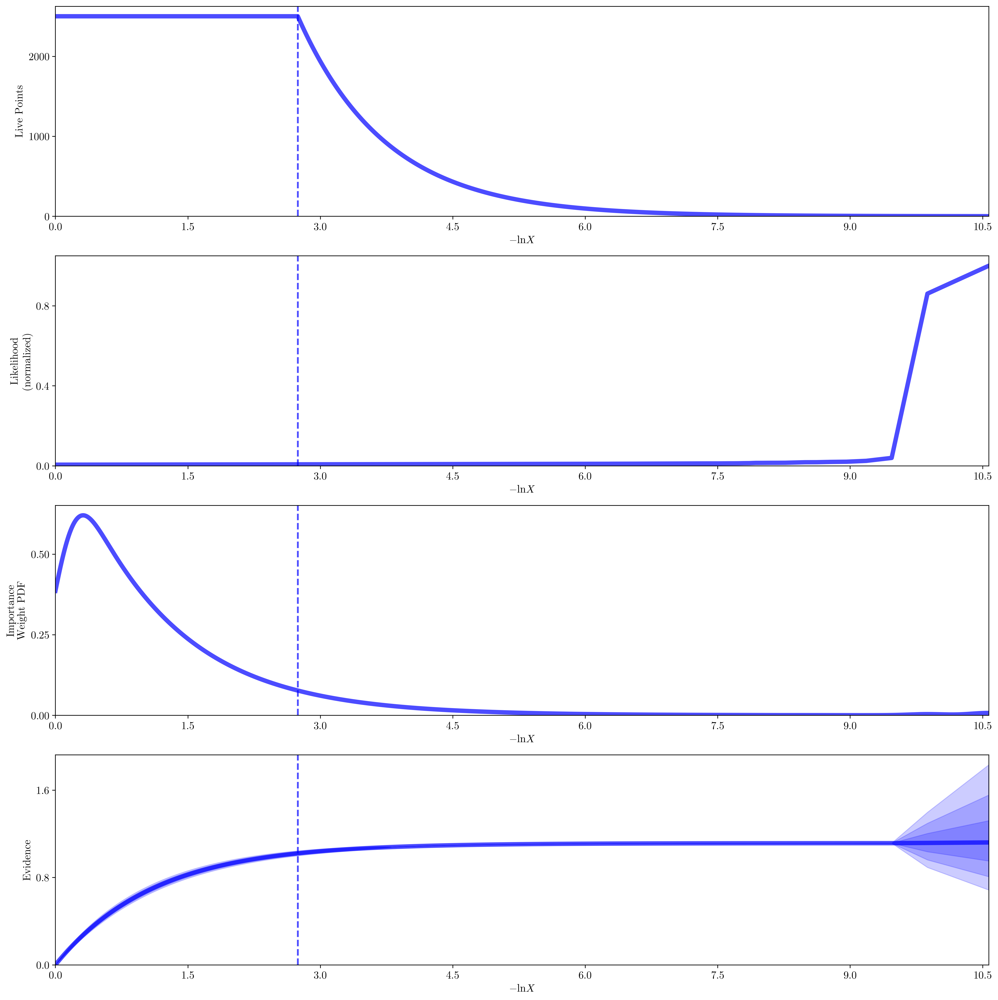

In [136]:
rfig, raxes = dyplot.runplot(results)
rfig.tight_layout()

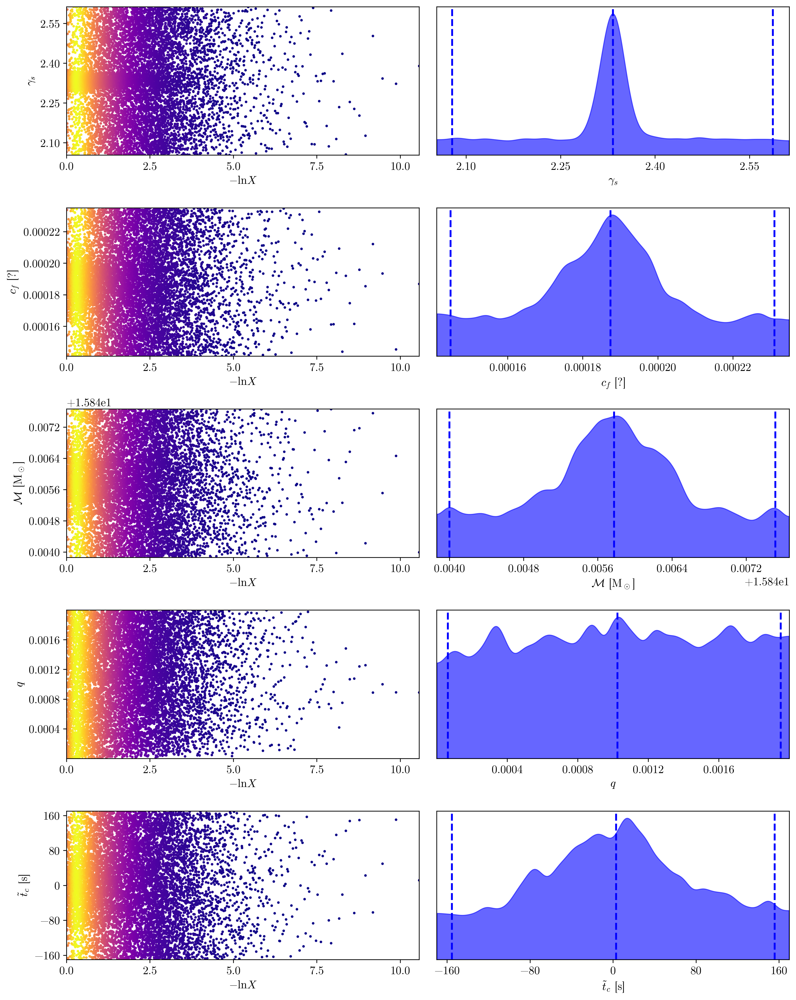

In [137]:
tfig, taxes = dyplot.traceplot(results, labels=labels)
tfig.tight_layout()

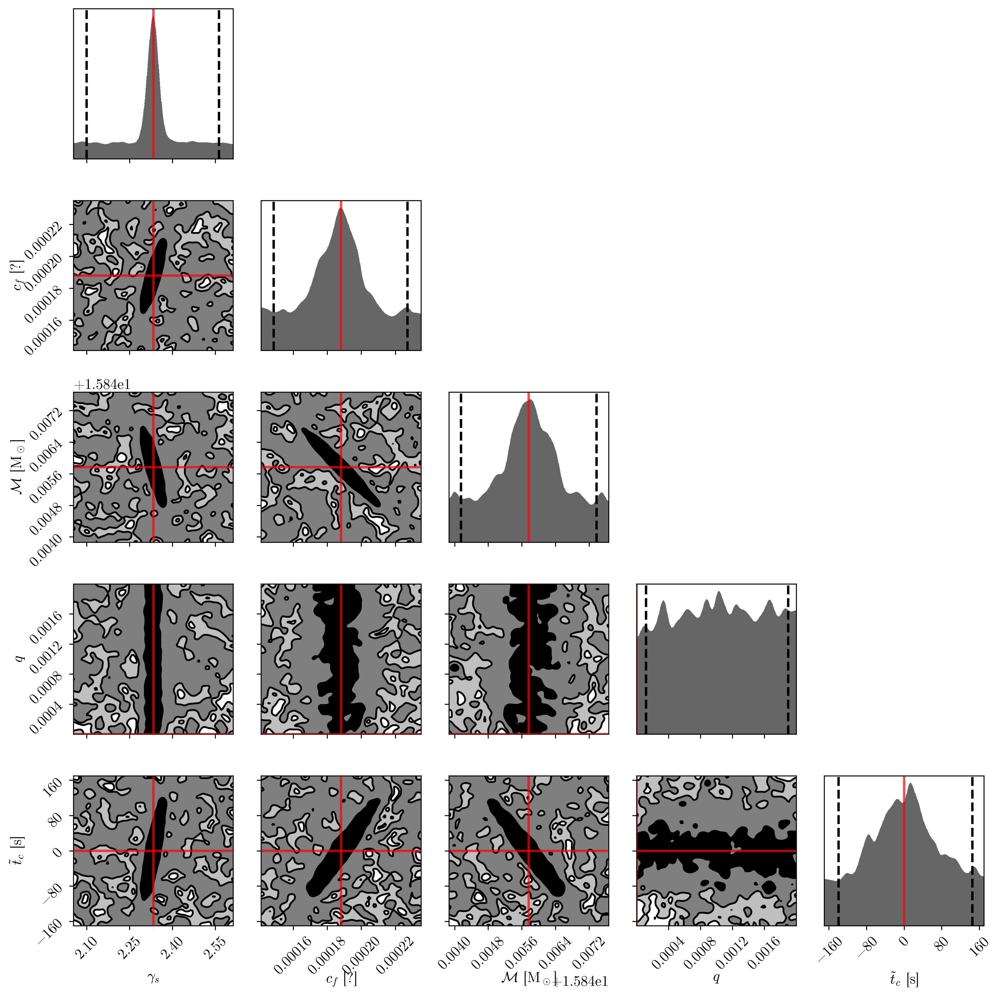

In [138]:
cfig, caxes = dyplot.cornerplot(
    results,
    labels=labels,
    quantiles=[1 - 0.95, 0.95],
    quantiles_2d=[1 - np.exp(-x ** 2 / 2) for x in [1, 2, 3]],#, 4, 5]],
#     smooth=0.02,
#     cmap="viridis",
    truths=truths,
)
cfig.tight_layout()

## Vacuum system
Try to get working for a marginally-detectable system.

In [285]:
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(1e-3 * MSUN / PC ** 3)
gamma_s = jnp.array(2.2)
dd_s = make_dynamic_dress(m_1, m_2, rho_s, gamma_s)
dd_v = VacuumBinary(dd_s.M_chirp, dd_s.Phi_c, dd_s.tT_c, dd_s.dL_iota, dd_s.f_c)

t_obs_lisa = 5 * YR
f_l = minimize_scalar(
    lambda f: (t_to_c(f, dd_s) - t_obs_lisa) ** 2, bracket=(1e-4, 1e-1)
).x
f_c = dd_s.f_c

# Dephasing
dN = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive): {dN}")

dN (naive): 32.47354087843051


In [305]:
# @jax.jit
def logL_v(x):
    M_chirp_MSUN, tT_c = x
    vb_h = VacuumBinary(
        M_chirp_MSUN * MSUN,
        dd_s.Phi_c,  # fixed
        tT_c,
        dd_s.dL_iota,  # value doesn't matter
        dd_s.f_c
    )
    return loglikelihood(vb_h, dd_s, f_l, dd_s.f_c, 3000, 3000)

In [306]:
dM_chirp_MSUN_min, dM_chirp_MSUN_max = 5.25e-5, 6.5e-5
tT_c_min, tT_c_max = -100, -20

prior_vol_v = (dM_chirp_MSUN_max - dM_chirp_MSUN_min) * (tT_c_max - tT_c_min)

labels_v = (r"$\mathcal{M}$ [M$_\odot$]", r"$\tilde{t}_c$ [s]")


def ptform_v(u):
    dM_chirp_MSUN = (dM_chirp_MSUN_max - dM_chirp_MSUN_min) * u[0] + dM_chirp_MSUN_min
    return jnp.array(
        [
            dd_s.M_chirp / MSUN + dM_chirp_MSUN,
            (tT_c_max - tT_c_min) * u[1] + tT_c_min,
        ]
    )

Check the likelihood directly

In [310]:
M_chirp_MSUN_mg, tT_c_mg = ptform_v(
    jnp.stack(
        jnp.meshgrid(
            jnp.linspace(0, 1, 40),
            jnp.linspace(0, 1, 35),
        )
    )
)

logLs = jax.lax.map(
    logL_v, jnp.stack([M_chirp_MSUN_mg.flatten(), tT_c_mg.flatten()]).T
).reshape(tT_c_mg.shape)

In [313]:
# Estimate maximum-likelihood vacuum system
idx_max = jnp.argmax(logLs)
dd_v_MLE = VacuumBinary(
    M_chirp_MSUN_mg.flatten()[idx_max] * MSUN,
    dd_s.Phi_c,
    tT_c_mg.flatten()[idx_max],
    dd_s.dL_iota,
    dd_s.f_c,
)
print("MLE V params = ", dd_v_MLE.M_chirp / MSUN, dd_v_MLE.tT_c)
print("True params  = ", dd_s.M_chirp / MSUN, dd_s.tT_c, "\n")

dN_naive = (Phi_to_c(f_l, dd_v) - Phi_to_c(f_l, dd_s)) / (2 * pi)
dN = (Phi_to_c(f_l, dd_v_MLE) - Phi_to_c(f_l, dd_s)) / (2 * pi)
print(f"dN (naive) = {dN_naive}")
print(f"dN (MLE)   = {dN}\n")

print(f"logL(D|D)     = {loglikelihood(dd_s, dd_s, f_l, dd_s.f_c, 3000, 3000)}")
print(f"logL(V_MLE|D) = {loglikelihood(dd_v_MLE, dd_s, f_l, dd_s.f_c, 3000, 3000)}")

MLE V params =  15.845822307935157 -48.23529411764706
True params  =  15.845764038704388 0.0 

dN (naive) = 32.47354087843051
dN (MLE)   = -2.5500924314817883

logL(D|D)     = 42.26653735672357
logL(V_MLE|D) = 34.72610571391932


Text(0, 0.5, '$\\tilde{t}_c$ [s]')

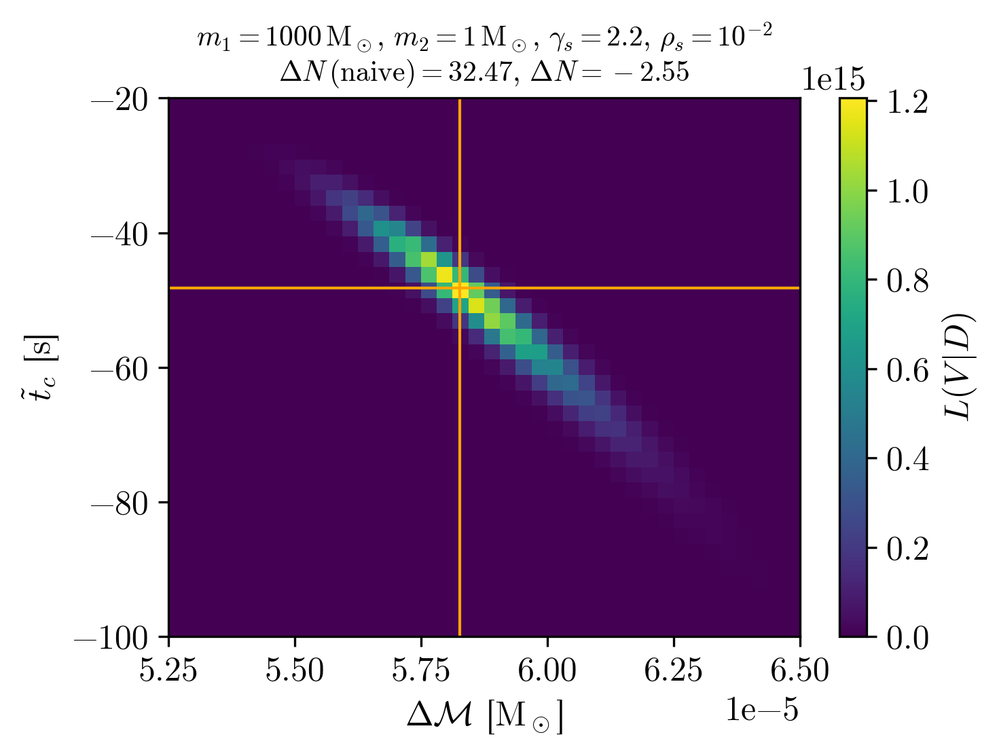

In [316]:
plt.imshow(
    jnp.exp(logLs),
    extent=(
        M_chirp_MSUN_mg.min() - dd_s.M_chirp / MSUN,
        M_chirp_MSUN_mg.max() - dd_s.M_chirp / MSUN,
        tT_c_mg.min(),
        tT_c_mg.max(),
    ),
    origin="lower",
    aspect="auto",
)

# True parameters
# plt.axvline(0.0, color="r", linewidth=1)
# plt.axhline(dd_s.tT_c, color="r", linewidth=1)

# MLE parameters
plt.axvline((dd_v_MLE.M_chirp - dd_s.M_chirp) / MSUN, color="orange", linewidth=1)
plt.axhline(dd_v_MLE.tT_c, color="orange", linewidth=1)

plt.colorbar(label=r"$L(V \, | D)$")
plt.title(
    r"$m_1 = %i \, \mathrm{M}_\odot, \, m_2 = %i \, \mathrm{M}_\odot, \, \gamma_s = %.1f, \, \rho_s = 10^{%i}$"
    % (m_1 / MSUN, m_2 / MSUN, gamma_s, jnp.log10(rho_s / (MSUN / PC ** 3)))
    + "\n"
    + r"$\Delta N \, (\mathrm{naive}) = %.2f, \, \Delta N = %.2f$" % (dN_naive, dN),
    fontsize=10,
)
plt.xlabel(r"$\Delta\mathcal{M}$ [M$_\odot$]")
plt.ylabel(r"$\tilde{t}_c$ [s]")

Run nested sampling

In [317]:
sampler_v = dynesty.NestedSampler(logL_v, ptform_v, 2, nlive=300, bound="multi")
sampler_v.run_nested()
results_v = sampler_v.results

1497it [00:34, 43.53it/s, +300 | bound: 3 | nc: 1 | ncall: 11376 | eff(%): 15.796 | loglstar:   -inf < 34.729 <    inf | logz: 31.034 +/-  0.134 | dlogz:  0.001 >  0.309]


In [318]:
results_v.summary()

Summary
nlive: 300
niter: 1497
ncall: 11376
eff(%): 15.796
logz: 31.034 +/-  0.134


Evidence comparison!

In [324]:
(prior_vol * jnp.exp(results.logz[-1]) / (prior_vol_v * jnp.exp(results_v.logz[-1]))) / 1e4

DeviceArray(1.75105527, dtype=float64)

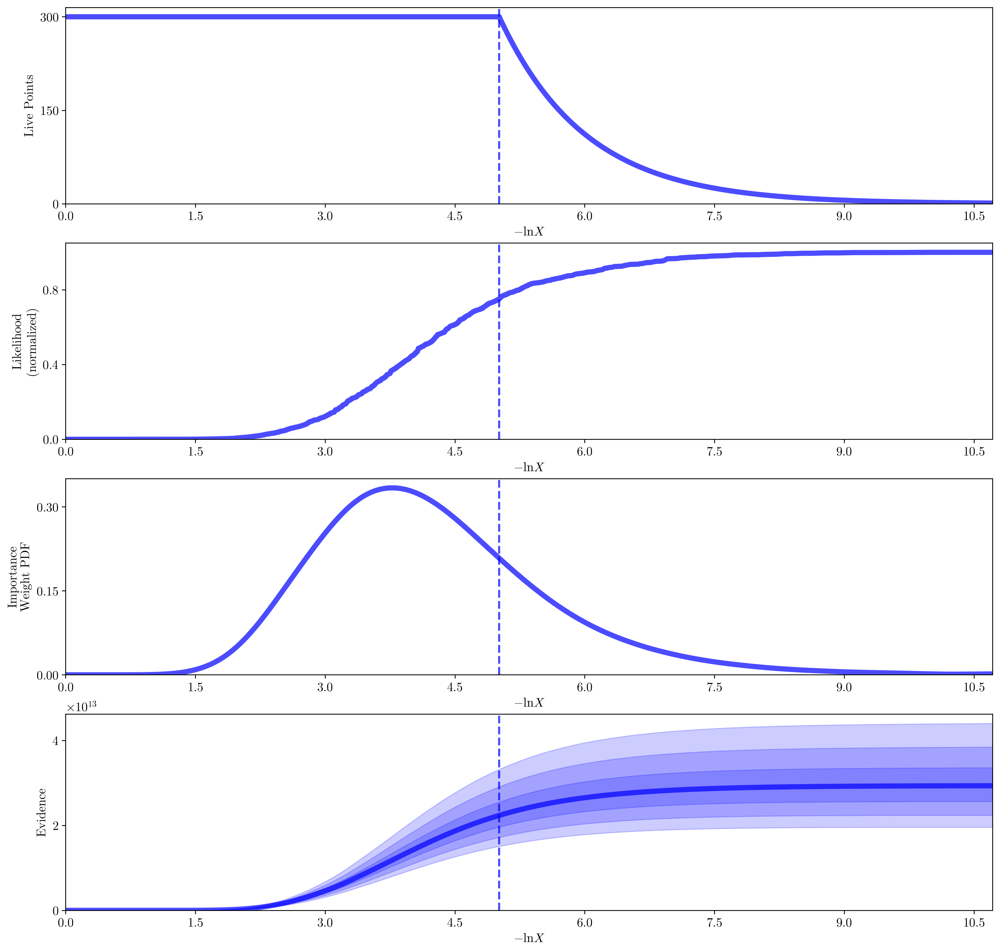

In [292]:
rfig, raxes = dyplot.runplot(results_v)

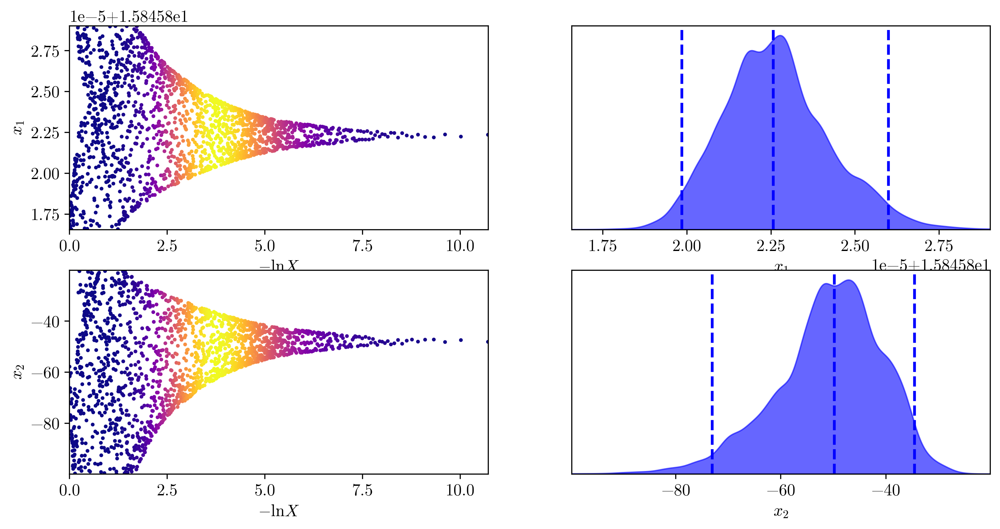

In [293]:
tfig, taxes = dyplot.traceplot(results_v)

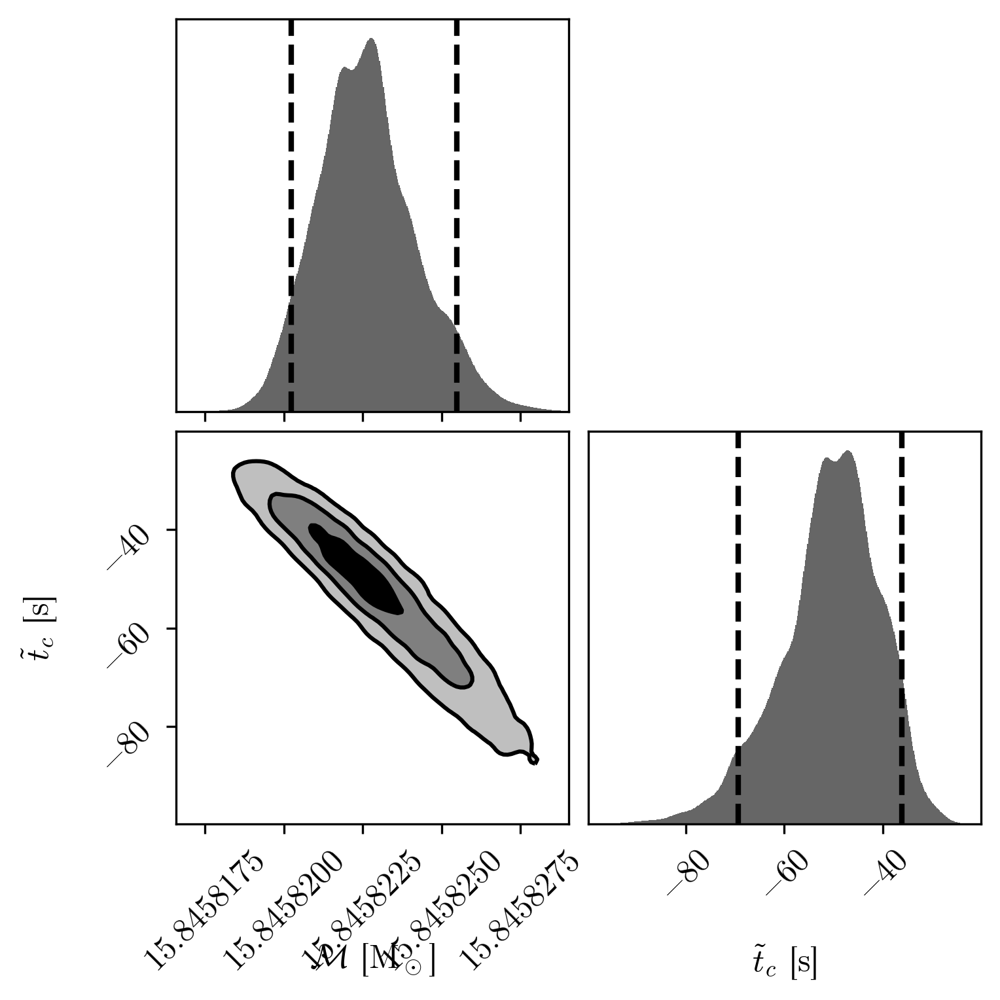

In [294]:
cfig, caxes = dyplot.cornerplot(
    results_v,
    labels=labels_v,
    quantiles=[1 - 0.95, 0.95],
    quantiles_2d=[1 - np.exp(-(x ** 2) / 2) for x in [1, 2, 3]],
)

## Dynamic dress, fundamental parameters
Not working... Might be nice to try again.

In [2]:
import dynesty
from dynesty import plotting as dyplot

In [167]:
m_1_ref = jnp.array(1e3 * MSUN)
m_2_ref = jnp.array(1 * MSUN)
rho_s_ref = jnp.array(226 * MSUN / PC ** 3)
gamma_s_ref = jnp.array(7 / 3)
dL_ref = 1e8 * PC
f_l = jnp.array(0.022621092492458004)  # Hz
f_c = get_f_isco(m_1_ref)
dd_s = make_dynamic_dress(m_1_ref, m_2_ref, rho_s_ref, gamma_s_ref, dL=dL_ref)


# @jax.jit
def logL(x):
    (
        m_1_MSUN,
        rho_s_MSUN_PC3,
        t_c
    ) = x
    
    m_1 = m_1_MSUN * MSUN
    m_2 = m_2_ref
    rho_s = rho_s_MSUN_PC3 * MSUN / PC**3
    gamma_s = gamma_s_ref
    
    c_f = get_c_f(m_1, m_2, rho_s, gamma_s)
    M_chirp = get_M_chirp(m_1, m_2)
    dL_iota = get_dL_iota(dL_ref, 0.)
    f_c = get_f_isco(m_1)
    dd_h = DynamicDress(
        gamma_s, c_f, M_chirp, m_2 / m_1, 0., t_c, dL_iota, f_c
    )
    
    f_h = jnp.maximum(dd_s.f_c, dd_h.f_c)
    return loglikelihood(dd_h, dd_s, f_l, f_h, 3000, 3000)

In [168]:
print(logL(jnp.array([
    m_1_ref / MSUN,
    rho_s_ref / (MSUN / PC**3),
    0.
])))
print(logL(jnp.array([
    m_1_ref / MSUN,
    rho_s_ref / (MSUN / PC**3),
    0.
])))

42.26262029583366
42.26262029583366


In [189]:
r_m_1_MSUN = 1.5e-5
d_rho_s_MSUN_PC3 = 2e-2
# r_gamma_s = 1e-1
d_t_c = 50

labels = (
    r"$m_1$ [M$_\odot$]",
    r"$\rho_s$ [M$_\odot$ pc$^3$]",
    r"$\tilde{t}_c$ [s]"
)

def ptform(u):
    x = jnp.array([
        m_1_ref / MSUN * (1 + r_m_1_MSUN * (2 * u[0] - 1)),
        rho_s_ref / (MSUN / PC**3) * (1 + d_rho_s_MSUN_PC3 * (2 * u[1] - 1)),
        d_t_c * (2 * u[2] - 1)
    ])
    return x

In [190]:
n = 1000
xs = np.zeros((n, len(labels)))
logLs = np.zeros(n)
for i in range(n):
    xs[i] = ptform(np.random.rand(xs.shape[1]))
    logLs[i] = logL(xs[i])

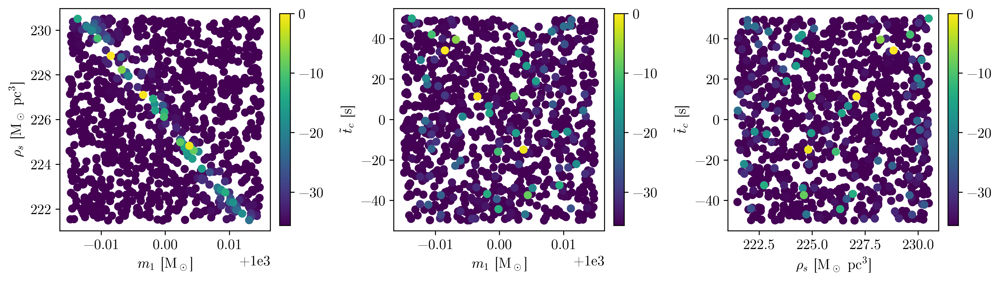

In [191]:
combos = [(i, j) for i in range(len(labels) - 1) for j in range(i + 1, len(labels))]
order = np.argsort(logLs)

fig, axes = plt.subplots(1, len(combos), figsize=(4 * len(combos), 3.5))
if not hasattr(axes, "__len__"):
    axes = [axes]

for (i, j), ax in zip(combos, axes):
    ax.set_xlabel(labels[i])
    ax.set_ylabel(labels[j])
    sc = ax.scatter(xs[order, i], xs[order, j], c=(logLs - logLs.max())[order])
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

fig.tight_layout()

In [151]:
rho_ss = jnp.linspace((1 - 1e-2) * rho_s_ref, (1 + 1e-2) * rho_s_ref, 200)
logLs = [
    loglikelihood(
        make_dynamic_dress(m_1_ref * (1 - 0), m_2_ref, rho_s, gamma_s_ref, dL=dL_ref),
        dd_s, f_l, dd_s.f_c, 5000, 3000
    ) for rho_s in rho_ss]

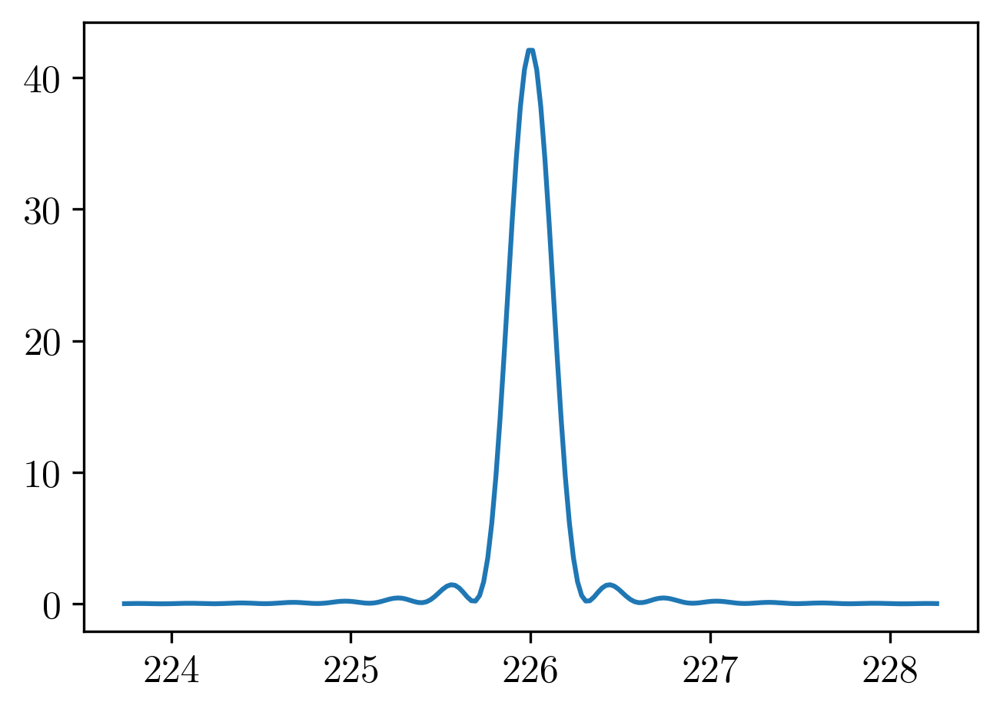

In [152]:
plt.plot(rho_ss / (MSUN / PC**3), logLs)

Run sampler

`2756it [02:01, 22.77it/s, bound: 0 | nc: 6 | ncall: 16613 | eff(%): 16.589 | loglstar:   -inf <  0.289 <    inf | logz:  0.031 +/-  0.012 | dlogz:  2.328 >  1.009]`

In [17]:
sampler = dynesty.NestedSampler(
    logL_4d, ptform, len(labels), nlive=50 * (4 + 1) * 3, bound="multi"
)
sampler.run_nested()
results = sampler.results

1016it [00:15, 65.69it/s, bound: 0 | nc: 4 | ncall: 2864 | eff(%): 35.475 | loglstar:   -inf <  0.155 <    inf | logz: -0.236 +/-  0.028 | dlogz:  1.817 >  0.759] 


KeyboardInterrupt: 

## Hypergeometric dress
No advantage over other parametrizations.

In [3]:
import dynesty
from dynesty import plotting as dyplot

In [12]:
m_1 = jnp.array(1e3 * MSUN)
m_2 = jnp.array(1 * MSUN)
rho_s = jnp.array(226 * MSUN / PC**3)
gamma_s = jnp.array(7 / 3)
f_l = jnp.array(0.022621092492458004)  # Hz
f_c = get_f_isco(m_1)
hd_s = make_hypgeom_dress(m_1, m_2, rho_s, gamma_s)


# @jax.jit
def logL_hd(x):
    lam, eta, M_chirp_MSUN, tT_c = x
    hd_h = HypGeomDress(
        lam,  # ~ gamma_s
        eta,  # ~ c_f
        M_chirp_MSUN * MSUN,
        hd_s.f_b,  # ~ q
        hd_s.Phi_c,  # fixed
        tT_c,
        hd_s.dL_iota,  # value doesn't matter
        hd_s.f_c  # TODO: change...
    )
    f_h = jnp.maximum(hd_s.f_c, hd_h.f_c)
    return loglikelihood(hd_h, hd_s, f_l, f_h, 3000, 3000)

In [13]:
print(logL_hd(jnp.array([hd_s.lam, hd_s.eta, hd_s.M_chirp / MSUN, hd_s.tT_c])))
print(logL_hd(jnp.array([hd_s.lam, hd_s.eta, hd_s.M_chirp / MSUN, hd_s.tT_c])))

42.26262029583365
42.26262029583365


In [49]:
r_lam = 1.5e-1
r_eta = 1.5e-1
r_M_chirp_MSUN = 5e-4
d_tT_c = 100

labels = (
    r"$\lambda$",
    r"$\eta$ [?]",
    r"$\mathcal{M}$ [M$_\odot$]",
    r"$\tilde{t}_c$ [s]"
)

truths = (hd_s.lam, hd_s.eta, hd_s.M_chirp / MSUN, hd_s.tT_c)

def ptform(u):
    return jnp.array([
        hd_s.lam * (1 + r_lam * (2 * u[0] - 1)),
        hd_s.eta * (1 + r_eta * (2 * u[1] - 1)),
        hd_s.M_chirp / MSUN * (1 + r_M_chirp_MSUN * (2 * u[2] - 1)),
        d_tT_c * (2 * u[3] - 1)
    ])

Run sampler

At 13.22: `20585it [1:16:38,  1.96s/it, bound: 167 | nc: 76 | ncall: 599031 | eff(%):  3.436 | loglstar:   -inf <  6.225 <    inf | logz:  0.143 +/-  0.010 | dlogz: 27.537 >  2.009]`

In [57]:
sampler = dynesty.NestedSampler(
    logL_hd, ptform, len(labels), nlive=50 * (4 + 1) * 8, bound="multi"
)
sampler.run_nested()
results = sampler.results

37339it [1:27:24,  7.12it/s, +2000 | bound: 200 | nc: 1 | ncall: 698080 | eff(%):  5.635 | loglstar:   -inf < 42.171 <    inf | logz: 22.359 +/-  0.194 | dlogz:  0.002 >  2.009]


In [58]:
results.summary()

Summary
nlive: 2000
niter: 37339
ncall: 698080
eff(%):  5.635
logz: 22.359 +/-  0.194


In [59]:
# # Save results!
# with open('3d-hd-dynesty-sampler.pkl', 'wb') as output:
#     pickle.dump(sampler, output, pickle.HIGHEST_PROTOCOL)

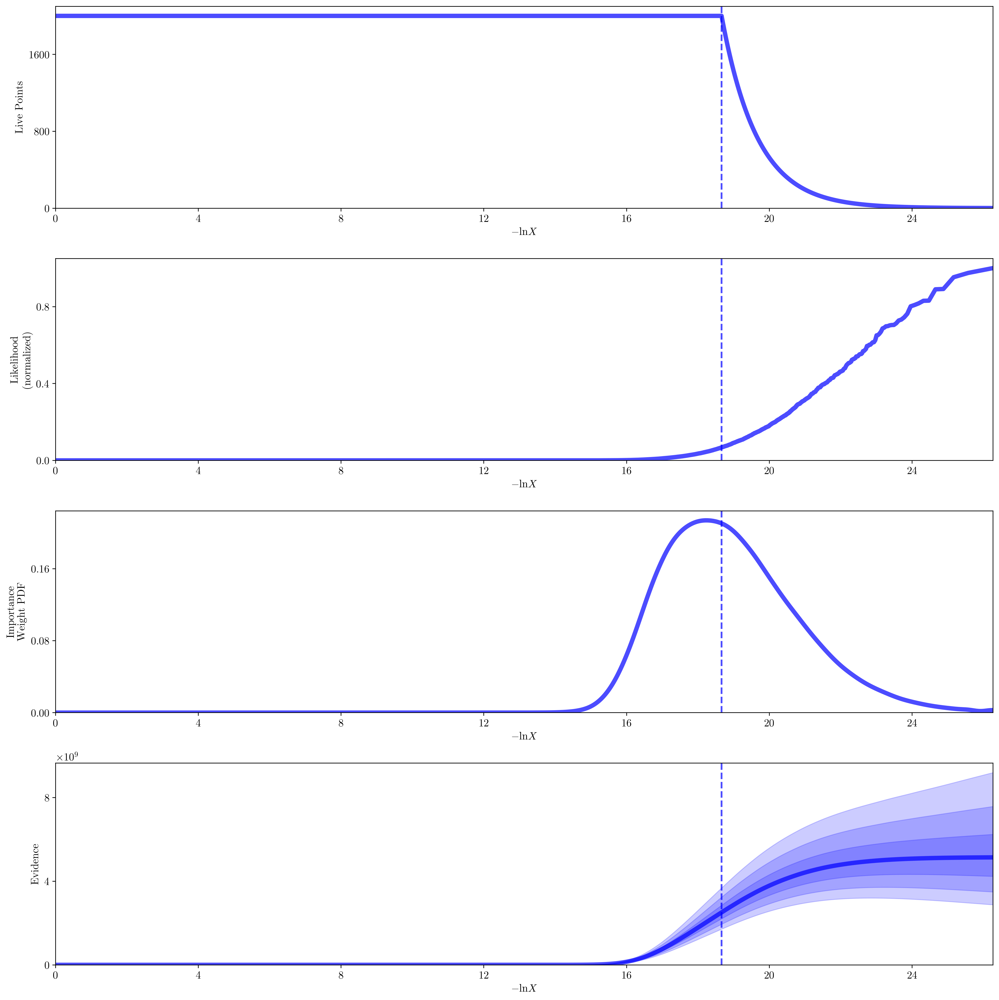

In [60]:
rfig, raxes = dyplot.runplot(results)
rfig.tight_layout()

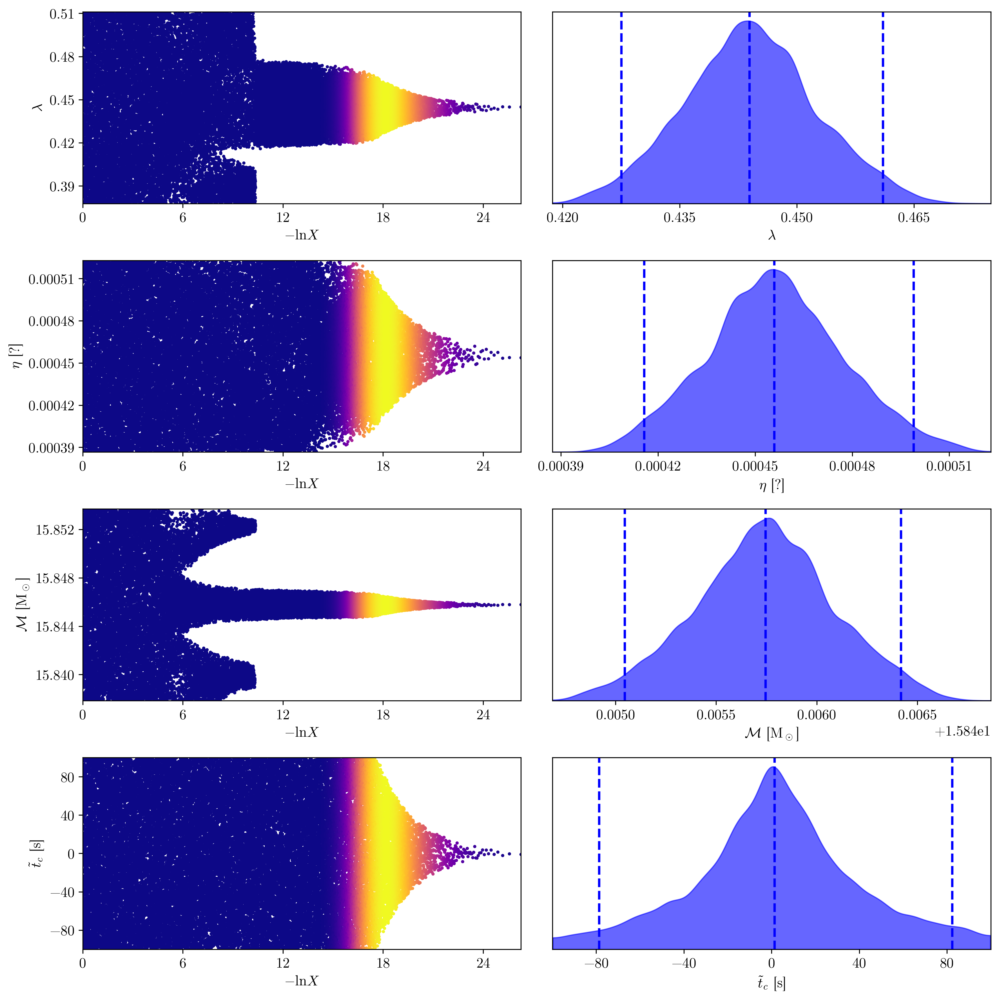

In [61]:
tfig, taxes = dyplot.traceplot(results, labels=labels)
tfig.tight_layout()

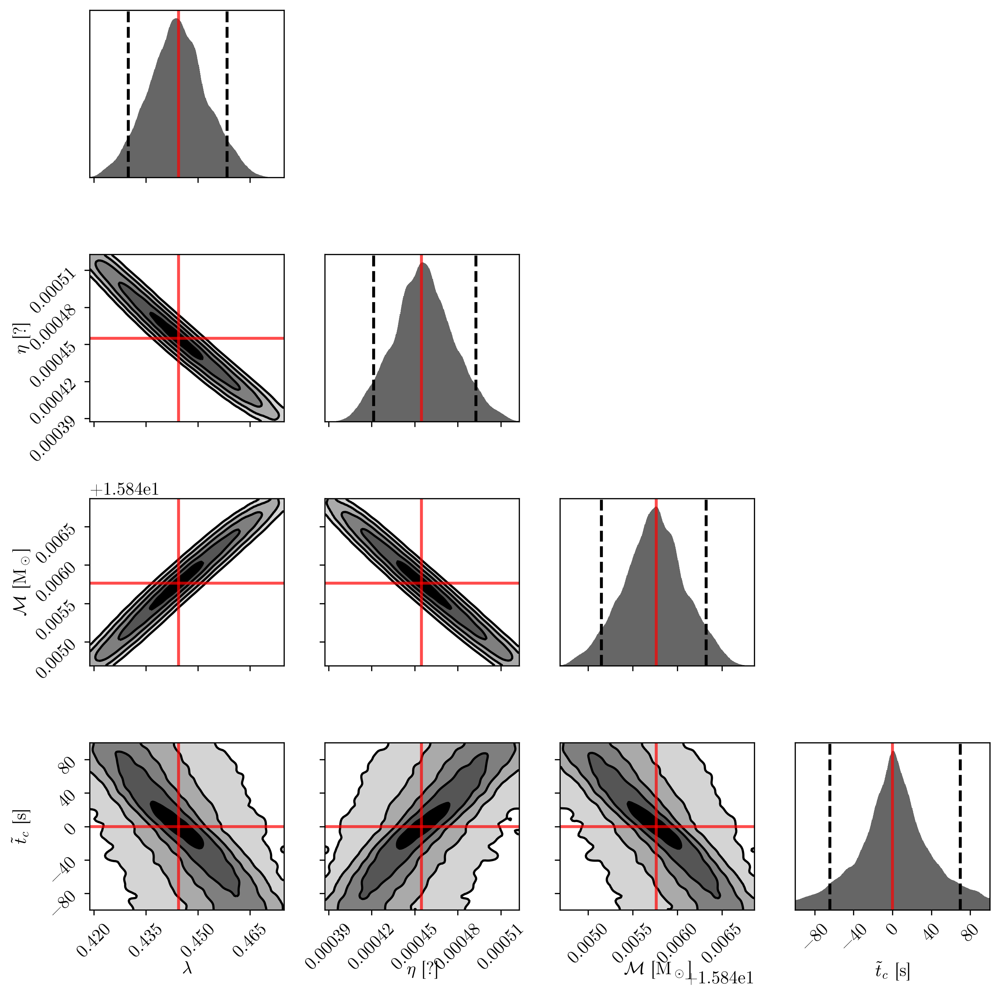

In [63]:
cfig, caxes = dyplot.cornerplot(
    results,
    labels=labels,
    quantiles=[1 - 0.95, 0.95],
    quantiles_2d=[1 - np.exp(-x ** 2 / 2) for x in [1, 2, 3, 4, 5]],
#     smooth=0.02,
#     cmap="viridis",
    truths=truths,
)
cfig.tight_layout()